In [1]:
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns

from pandas import set_option
# set_option("display.max_rows", 10)
pd.options.mode.chained_assignment = None

###### Import packages needed for the make_vars functions
from scipy.interpolate import interp1d
import pywt

from skimage.filters.rank import entropy
from skimage.morphology import rectangle
from skimage.util import img_as_ubyte

filename = 'data/facies_vectors.csv'
training_data = pd.read_csv(filename)
training_data.head()

,Facies,Formation,Well Name,Depth,GR,ILD_log10,DeltaPHI,PHIND,PE,NM_M,RELPOS
0,3,A1 SH,SHRIMPLIN,2793.0,77.45,0.664,9.9,11.915,4.6,1,1.000
1,3,A1 SH,SHRIMPLIN,2793.5,78.26,0.661,14.2,12.565,4.1,1,0.979
2,3,A1 SH,SHRIMPLIN,2794.0,79.05,0.658,14.8,13.050,3.6,1,0.957
3,3,A1 SH,SHRIMPLIN,2794.5,86.10,0.655,13.9,13.115,3.5,1,0.936
4,3,A1 SH,SHRIMPLIN,2795.0,74.58,0.647,13.5,13.300,3.4,1,0.915


In [2]:
def make_gradient_vars(wells_df,logs,dx_list):
    
    new_df = pd.DataFrame()
    grouped = wells_df.groupby(['Well Name'])
    
    for key in grouped.groups.keys():
    
        depth = grouped.get_group(key)['Depth']
        temp_df = pd.DataFrame()
        temp_df['Depth'] = depth

        for log in logs:

            temp_data = grouped.get_group(key)[log]

            for dx in dx_list:

                temp_df[log + 'gradient_dx' + str(dx)] = np.gradient(temp_data,dx)

        temp_df['Well Name'] = [key for _ in range(len(depth))]
        new_df = new_df.append(temp_df) 
    
    new_df = new_df.sort_index()
    new_df = new_df.drop(['Well Name','Depth'],axis=1)
    wells_df = wells_df[['Facies', 'Formation', 'Well Name', 'Depth']]
    return pd.concat([wells_df,new_df],axis=1)

In [3]:
###### From gradient
gradient_df = make_gradient_vars(wells_df=training_data, logs=['GR', 'ILD_log10', 'DeltaPHI', 'PE', 'PHIND'],
                                 dx_list=[2, 3, 4, 5, 6, 10, 20])
print (gradient_df.shape)
gradient_df.head(5)

(4149, 39)


,Facies,Formation,Well Name,Depth,GRgradient_dx2,GRgradient_dx3,GRgradient_dx4,GRgradient_dx5,GRgradient_dx6,GRgradient_dx10,...,PEgradient_dx6,PEgradient_dx10,PEgradient_dx20,PHINDgradient_dx2,PHINDgradient_dx3,PHINDgradient_dx4,PHINDgradient_dx5,PHINDgradient_dx6,PHINDgradient_dx10,PHINDgradient_dx20
0,3,A1 SH,SHRIMPLIN,2793.0,0.4050,0.270000,0.20250,0.162,0.135000,0.0810,...,-0.083333,-0.050,-0.0250,0.32500,0.216667,0.162500,0.1300,0.108333,0.06500,0.032500
1,3,A1 SH,SHRIMPLIN,2793.5,0.4000,0.266667,0.20000,0.160,0.133333,0.0800,...,-0.083333,-0.050,-0.0250,0.28375,0.189167,0.141875,0.1135,0.094583,0.05675,0.028375
2,3,A1 SH,SHRIMPLIN,2794.0,1.9600,1.306667,0.98000,0.784,0.653333,0.3920,...,-0.050000,-0.030,-0.0150,0.13750,0.091667,0.068750,0.0550,0.045833,0.02750,0.013750
3,3,A1 SH,SHRIMPLIN,2794.5,-1.1175,-0.745000,-0.55875,-0.447,-0.372500,-0.2235,...,-0.016667,-0.010,-0.0050,0.06250,0.041667,0.031250,0.0250,0.020833,0.01250,0.006250
4,3,A1 SH,SHRIMPLIN,2795.0,-3.0325,-2.021667,-1.51625,-1.213,-1.010833,-0.6065,...,0.008333,0.005,0.0025,0.06750,0.045000,0.033750,0.0270,0.022500,0.01350,0.006750


In [4]:
####### Creating dictionary of colours for the different facies
facies_colors = {1:'#F4D03F', 2:'#F5B041',3:'#DC7633',4:'#6E2C00',
       5:'#1B4F72',6:'#2E86C1', 7:'#AED6F1', 8:'#A569BD', 9:'#196F3D'}
facies_name = {1:'SS', 2:'CSiS',3:'FSiS',4:'SiSh', 5:'MS',6:'WS', 7:'D', 8:'PS', 9:'BS'}

flatui = ['#F4D03F', '#F5B041', '#DC7633', '#6E2C00',
       '#1B4F72', '#2E86C1', '#AED6F1', '#A569BD', '#196F3D']

In [5]:
sns.set()
temp_df = gradient_df
temp_df = temp_df.drop(['Formation', 'Well Name', 'Depth'], axis=1)
temp_df.dropna(inplace=True)
sns.pairplot(temp_df, hue='Facies', palette = flatui)

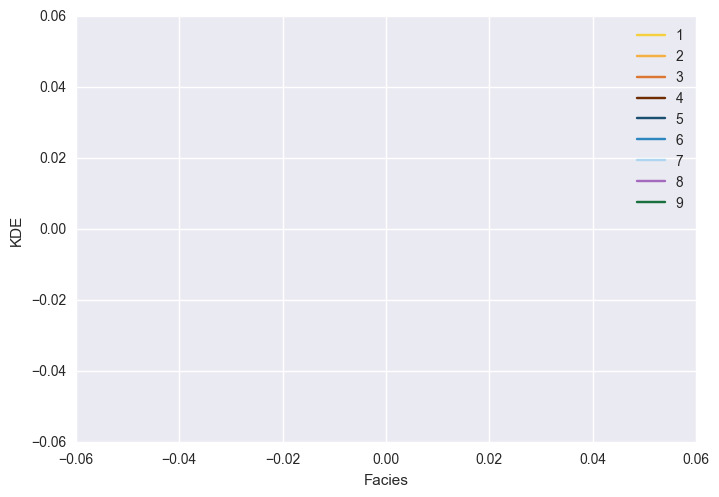

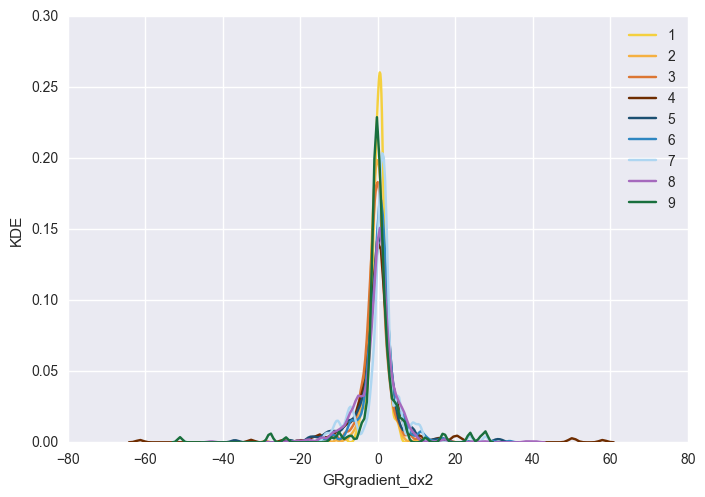

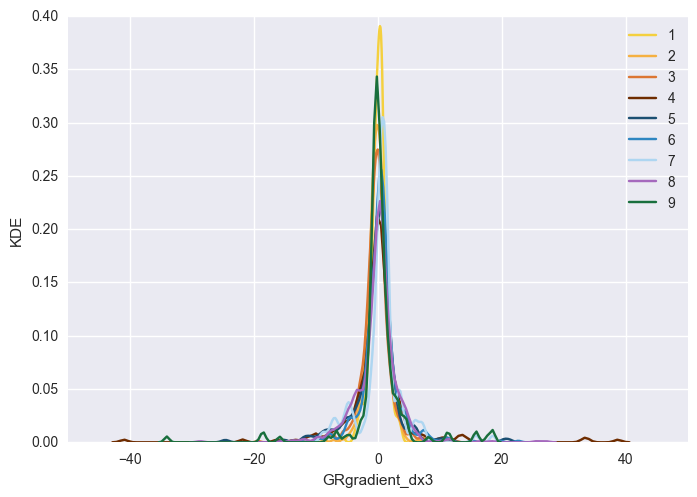

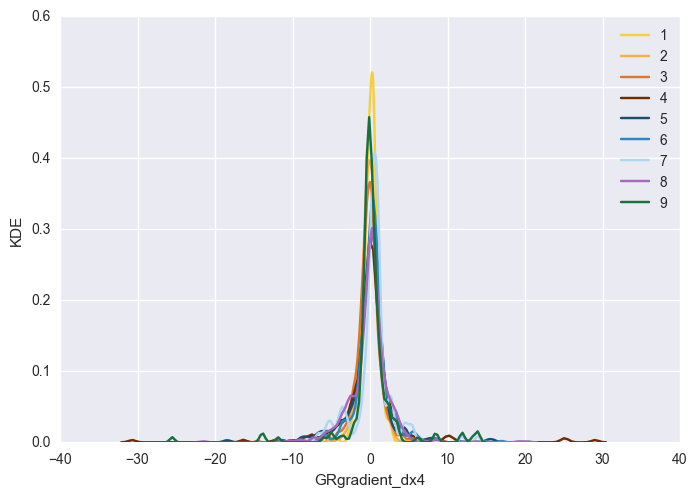

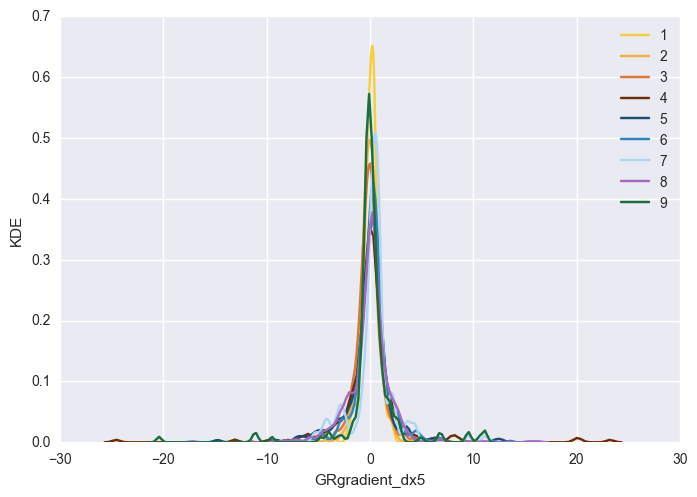

...

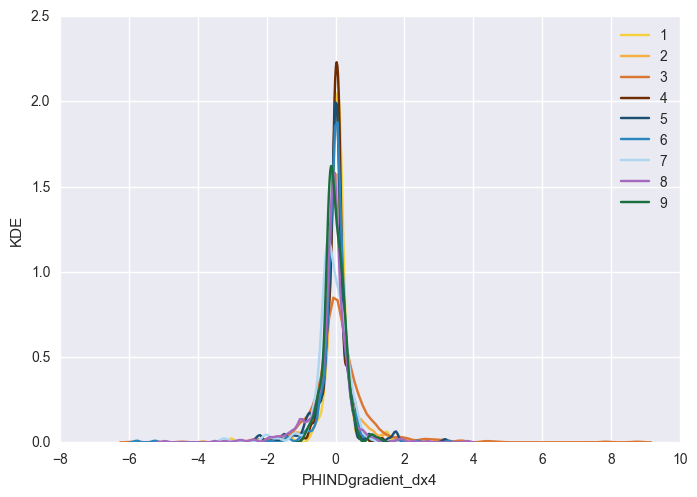

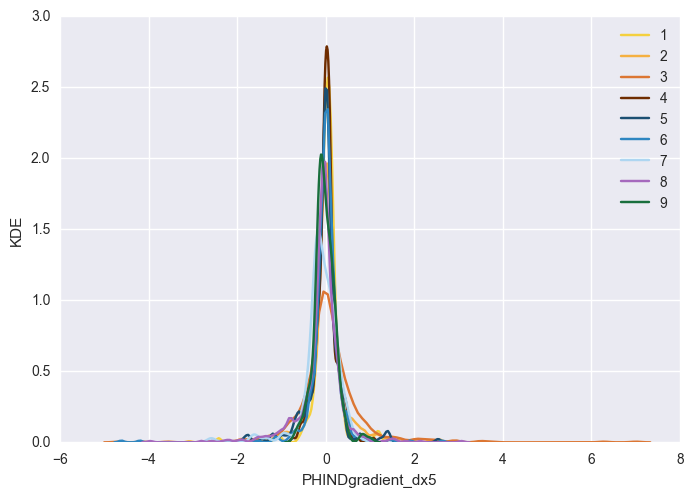

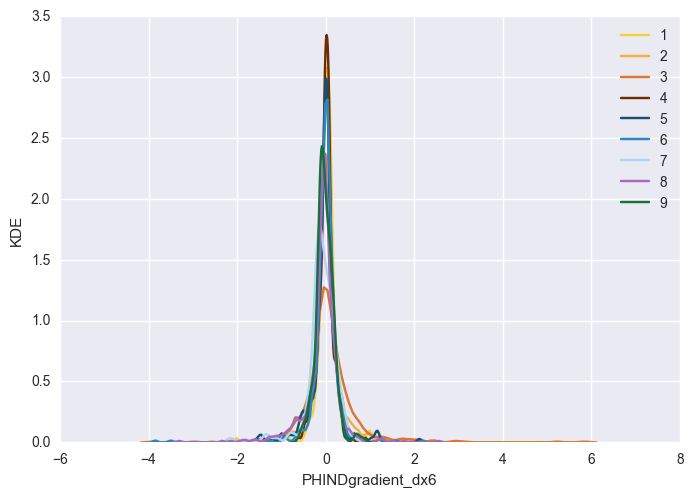

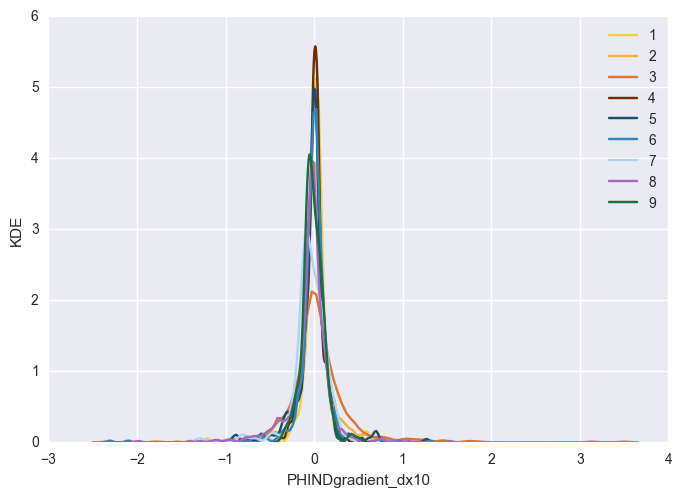

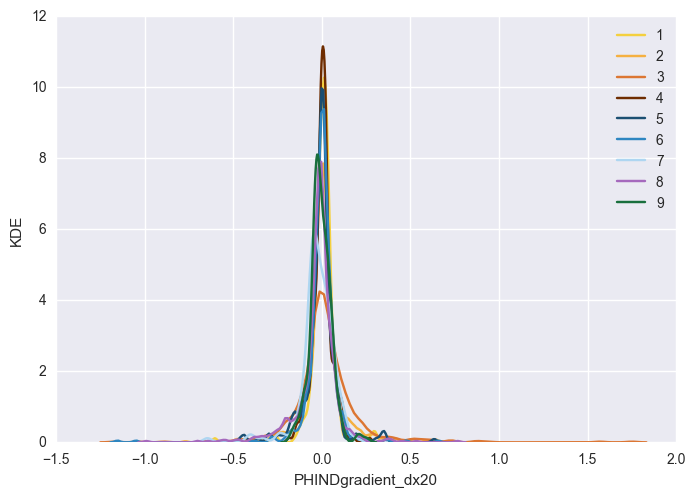

In [6]:
sns.set_palette(flatui)
list_variables = list(gradient_df.columns.values)
list_variables.remove('Formation')
list_variables.remove('Well Name')
list_variables.remove('Depth')
#list_variables = ['GR_cD_step_level_1', 'GR_cA_step_level_1', 'GR_cD_step_level_2', 'GR_cA_step_level_2', 'GR_cD_step_level_3', 'GR_cA_step_level_3']
for a in list_variables:
    for i in np.arange(1, 10, 1):
        sns.kdeplot(gradient_df[a][gradient_df['Facies'] == i], label=i)
    plt.xlabel(a)
    plt.ylabel('KDE')
    plt.show()